In [1]:
import cv2
import os
from sys import argv
import numpy as np
import argparse
from matplotlib import pyplot as plt
from skimage.util import random_noise
import pytesseract
from google.cloud import vision

# Cheque verification

### 1/ Data understanding
##### Variables :

##### CHEQUE NO : Cheque Reference

##### USER 1 : ID of the user who wrote the left half
##### PEN1 : ID of the pen used to write the left half
##### LETTERS WRIITEN 1 : Letters Written by the first user
##### USER 2 : ID of the user who wrote the right half
##### PEN2 : ID of the pen used to write the right part
##### LETTERS WRIITEN 2 :  Letters Written by the second user
##### BANK NAME : The name of the Bank

##### PEN ID : ID of the Pen used to write the cheque
##### PEN NAME  : The pen's brand's name
##### COLOR : Color of the pen (Black or Blue)

##### USER ID : ID of the user
##### USER NAME : Name of the user

# Data Collection

* We noticed that we don't have multiple variation of cheque format, so we had to collect more data.
* Source : https://www.kaggle.com/saifkhichi96/bank-checks-signatures-segmentation-dataset

# Challenges

* Scanning artifacts such as Small fonts, Noisy images, Faded images
* Multiple Cheque can be present on a single scanned image
* Variations in Cheque format as per banks
* Cheque amounts can be handwritten
* Account number (given in the MICR strip) can have spacing issues — e.g. can be merged with Routing number, or can have unusual white spaces
* OCR missing in recognizing some character due to Magnetic character / symbols and extracting text in wrong order on tilted Cheque
* Difficulty in extracting information from Logos, overlapping information or portions not properly scanned.


# RGB to Gray Scale

In [2]:
def RGB_toGray(currentWorkingDir,lena):
    lena_rgb = cv2.imread(lena)
    lena_rgb = cv2.cvtColor(lena_rgb, cv2.COLOR_BGR2RGB) 
    print("orginal lena shape :", lena_rgb.shape)
    lena_gray = cv2.imread(lena)
    lena_gray = cv2.resize(lena_gray, (920, 400))
    lena_gray = cv2.cvtColor(lena_gray, cv2.COLOR_BGR2GRAY) 
    print("gray scale lena shape :", lena_gray.shape)
    cv2.imwrite(currentWorkingDir + "/gray/"+image, lena_gray)

# Image Extraction

In [3]:
!pip install opencv-python

In [4]:
class ImageExtractor:
    def __init__(self, currentWorkingDir, imagePath):
        self.currentWorkingDir = currentWorkingDir
        self.image = cv2.imread(imagePath)
        self.imgResized = cv2.resize(self.image, (920, 400))
        print(imagePath[0:13:1])

    # Return Name Image extracted from Cheque
    def nameImage(self,image):
        nameExtractedImage = self.imgResized[80:125, 85:802]
        return nameExtractedImage

    # Return Amount Image extracted from Cheque
    def amountImage(self,image):
        amountExtractedImage = self.imgResized[147:185, 685:863]
        cv2.imwrite(self.currentWorkingDir + "/amount/"+image,amountExtractedImage)
        return self.currentWorkingDir + "/amount/"+image

    # Return Path of Signature Image extracted from Cheque
    def signatureImage(self,image):
        signExtractedImage = self.imgResized[250:350, 750:900]
        cv2.imwrite(self.currentWorkingDir + "/signature/"+image, signExtractedImage)
        return self.currentWorkingDir + "/signature/"+image

In [5]:
# Current Working Directory
currentWorkingDir = os.path.dirname(os.getcwd())
currentWorkingDir = os.path.join(currentWorkingDir, "PI")
print(currentWorkingDir)
# Image Path
imageDir = currentWorkingDir + "/Dataset/300"
imageDirGray = currentWorkingDir + "/result/gray"
print(imageDir)

/home/mehdi/Bureau/PI
/home/mehdi/Bureau/PI/Dataset/300


# Transform RGB image to Gray

In [6]:
for filename in os.listdir(imageDir):
    image = filename
    imagePath = os.path.join(imageDir,filename)
    imageExtractor = ImageExtractor(currentWorkingDir+"/result", imagePath)
    RGB_toGray(currentWorkingDir+"/result",imagePath)

/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1079, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1079, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1079, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1093, 2372, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1093, 2387, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1079, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1093, 2387, 3)
gra

orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1079, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1079, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1093, 2387, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1079, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1093, 2387, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1100, 2365, 3)
gray scale lena shape : (400, 920)
/home/mehdi/B
orginal lena shape : (1079, 2365, 3)
gray scale lena s

# Image Gray extraction

In [7]:
for filename in os.listdir(imageDirGray):  
    image = filename
    imagePath = os.path.join(imageDirGray,filename)
    imageExtractor = ImageExtractor(currentWorkingDir+"/result", imagePath)
    # Get name, amount and signature extracted from cheque
    nameImage = imageExtractor.nameImage(image)
    amountImage = imageExtractor.amountImage(image)
    signatureImage = imageExtractor.signatureImage(image)

/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/mehdi/B
/home/

# Hand Writing Recognition

In [8]:
class HandWritingRecognition:
    def __init__(self, nameImage, amountImage):
        self.nameImage = nameImage
        self.amountImage = amountImage
        self.client = vision.ImageAnnotatorClient()

    # Return ImageObject to be passed to visionApi
    def imageObjectCreation(self, ocrImage):
        imageString = cv2.imencode(".jpg", ocrImage)[1].tostring()
        imageObject = vision.Image(content=imageString)
        return imageObject

    # Return the text part of Response
    def printResponseText(self, response):
        docText = response.full_text_annotation.text
        return docText

    # Return Name from Image
    def nameOCR(self):
        nameObject = self.imageObjectCreation(self.nameImage)
        response = self.client.document_text_detection(image=nameObject)
        return self.printResponseText(response)

    # Return Amount from Image
    def amountOCR(self):
        amountObject = self.imageObjectCreation(self.amountImage)
        response = self.client.text_detection(image=amountObject)
        return self.printResponseText(response)

#### We need to have an automatic segmentation of objects, so we can

# Testing Line Segmentation 

In [9]:
testWorkingDir = os.path.dirname(os.getcwd())
testWorkingDir = os.path.join(testWorkingDir, "PI/")
print(testWorkingDir)

/home/mehdi/Bureau/PI/


In [10]:
image_file = testWorkingDir+"test3"
img = cv2.imread(image_file)

In [11]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

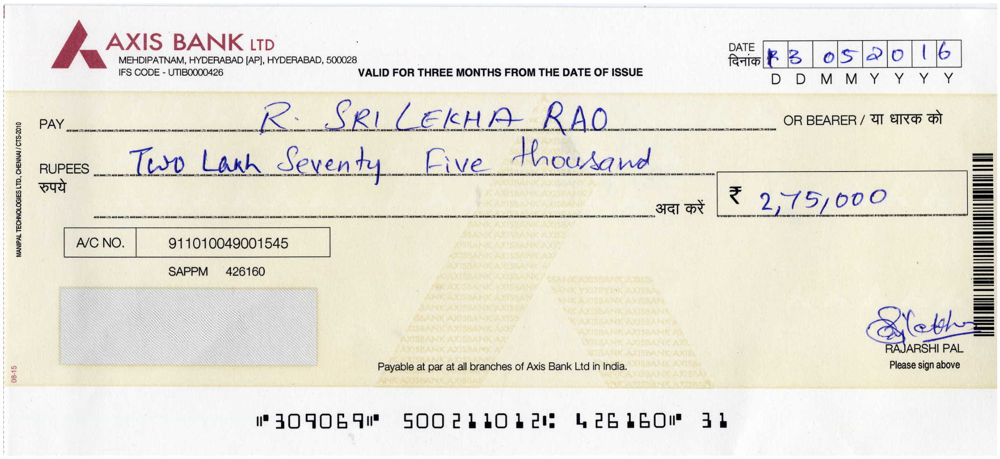

In [12]:
display(image_file)

In [13]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite(testWorkingDir+"temp/inverted.jpg", inverted_image)

True

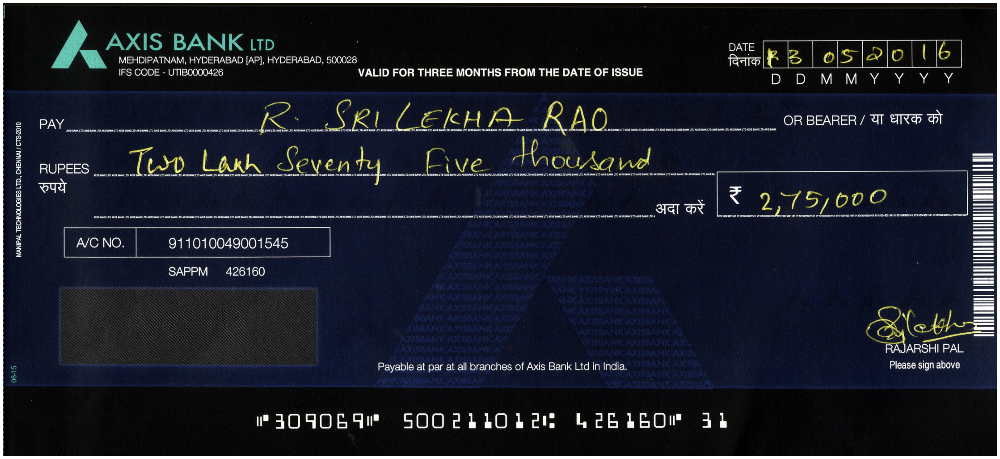

In [14]:
display("temp/inverted.jpg")

In [15]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [16]:
gray_image = grayscale(img)
cv2.imwrite("temp/gray.jpg", gray_image)

True

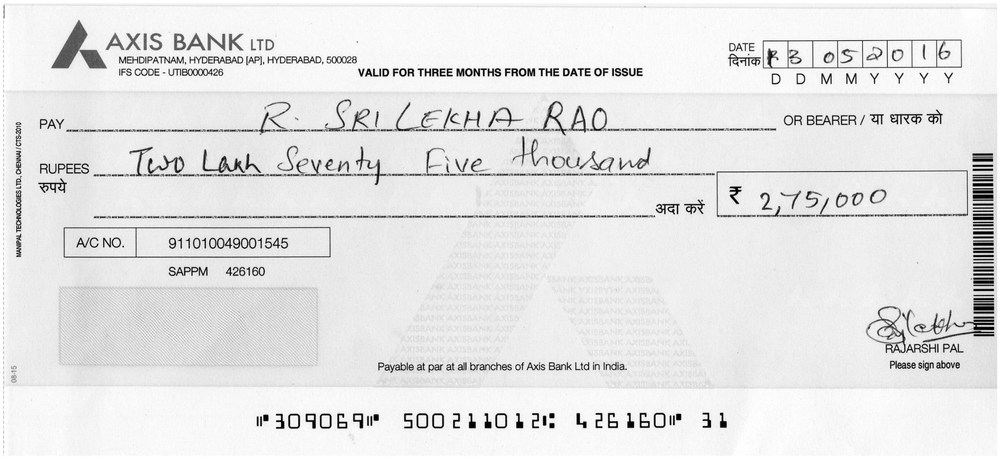

In [17]:
display("temp/gray.jpg")

In [18]:
thresh, im_bw = cv2.threshold(gray_image, 160,255, cv2.THRESH_BINARY_INV)
cv2.imwrite("temp/bw_image.jpg", im_bw)

True

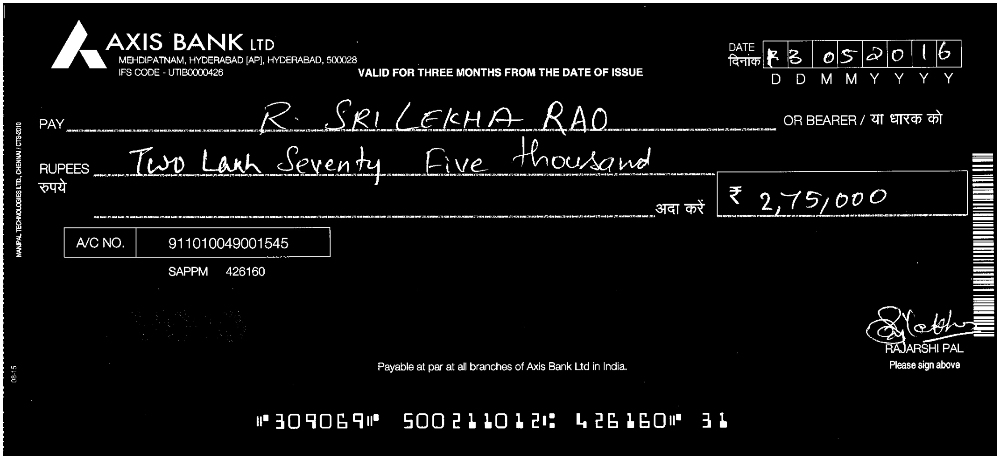

In [19]:
display("temp/bw_image.jpg")

In [20]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [21]:
no_noise = noise_removal(im_bw)
cv2.imwrite("temp/no_noise.jpg", no_noise)

True

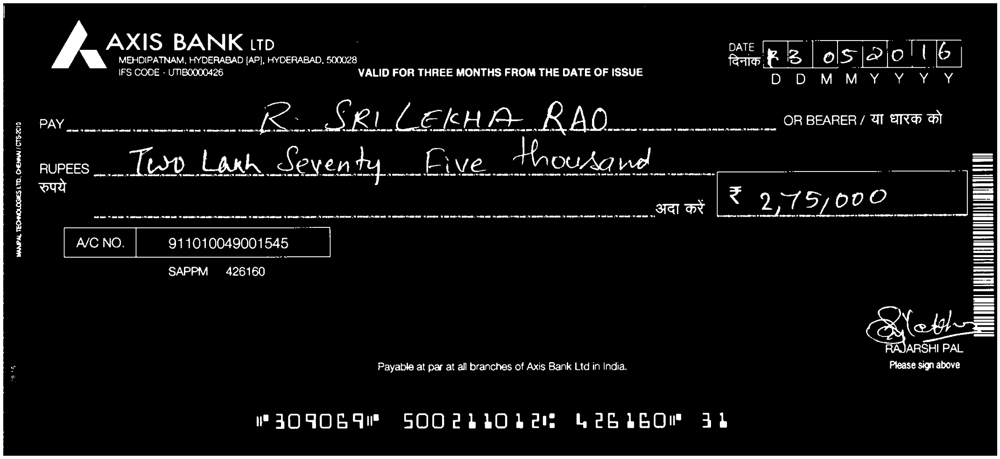

In [22]:
display("temp/no_noise.jpg")

In [23]:
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [24]:
eroded_image = thin_font(no_noise)
cv2.imwrite("temp/eroded_image.jpg", eroded_image)

True

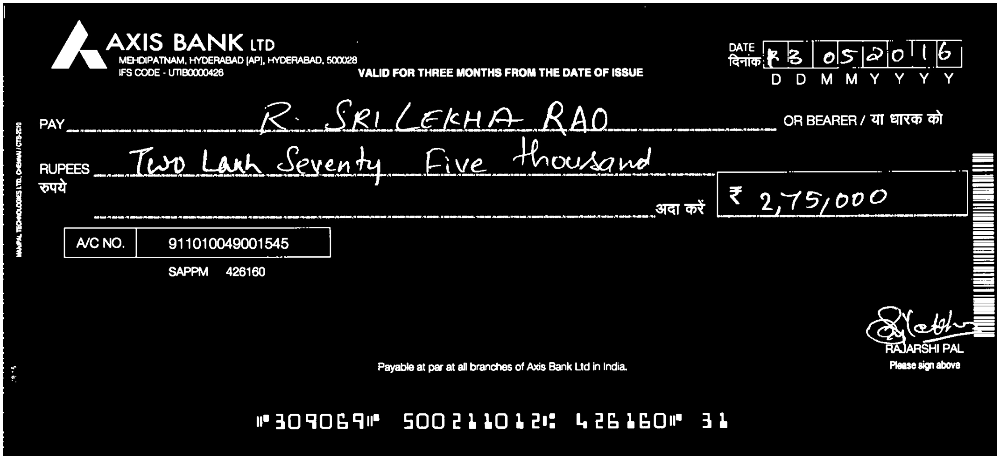

In [25]:
display("temp/eroded_image.jpg")

In [26]:
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [27]:
dilated_image = thick_font(no_noise)
cv2.imwrite("temp/dilated_image.jpg", dilated_image)

True

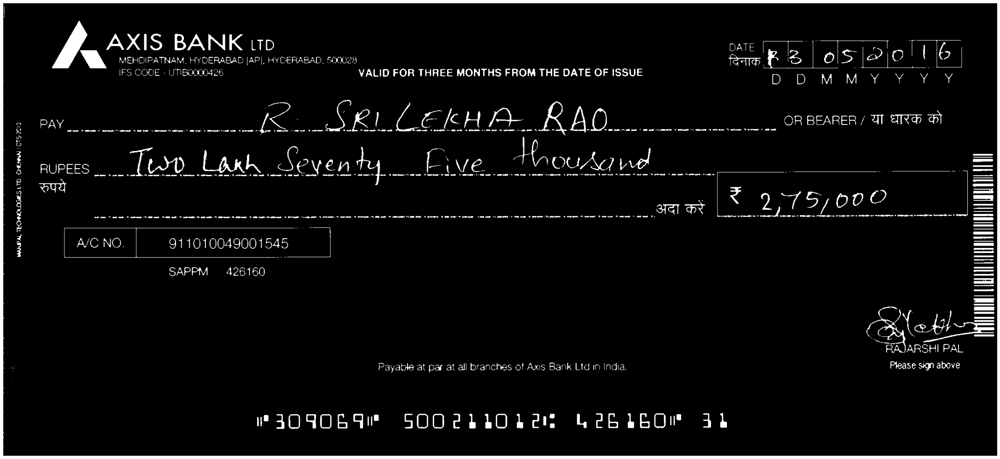

In [28]:
display("temp/dilated_image.jpg")

In [29]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

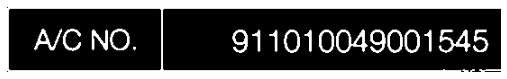

In [30]:
no_borders = remove_borders(no_noise)
cv2.imwrite("temp/no_borders.jpg", no_borders)
display('temp/no_borders.jpg')

# Line Segmentation

### Steps to Follow :

* Blur the image and if necessary convert to gray scale first.
* Apply the Canny edge detection algorithm to find the outline of every character.
* Pass the edge detected image to the Adaptive Algorithm which works better considering the neighbouring points.
* Perform dilation which performs better on line segmentation.
* Perform the line segmentation on the copy of dilated image which produces the segments randomly.
* Finally sort the segment in a order "Top to bottom".

In [37]:
testWorkingDir = os.path.dirname(os.getcwd())
testWorkingDir = os.path.join(testWorkingDir, "PI/")
#image_file = testWorkingDir+"test3"

imageDir = testWorkingDir + "Dataset/300"
print(imageDir)
#for filename in os.listdir(imageDir):  
#    filename= os.path.join(imageDir,filename)
image = cv2.imread(testWorkingDir+"test")
image = cv2.resize(image, (920, 400))
#image = image[:, 671:892]
image = cv2.bilateralFilter(image,10,75,75)
#cv2.imshow('orig',image)
#cv2.waitKey(0)

#grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2.imwrite(testWorkingDir+"segmentationTest/gray.jpg", gray)

#Threshold Image
ret,thresh = cv2.threshold(gray,170,255,cv2.THRESH_BINARY_INV)
cv2.imwrite(testWorkingDir+"segmentationTest/thresh.jpg", thresh)

#Image Dilation
kernel = np.ones((5,5), np.uint8)
img_dilation = cv2.dilate(thresh, kernel, iterations=4)
cv2.imwrite(testWorkingDir+"segmentationTest/img_dilation.jpg", img_dilation)


#Segmentation Part
ctrs, hier = cv2.findContours(img_dilation.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
sorted_ctrs = sorted(ctrs, key=lambda ctr: cv2.boundingRect(ctr)[0])

#image_sign = image[200:340, :]
#cv2.imwrite(testWorkingDir+"segmentationTest/signatures/"+filename[33:], image_sign)

#image_amount = image[143:200,:]
#cv2.imwrite(testWorkingDir+"segmentationTest/amount"+filename[33:], image_amount)



for i, ctr in enumerate(sorted_ctrs):
    # Get bounding box
    x, y, w, h = cv2.boundingRect(ctr)
    # Getting ROI
    roi = image[y:y+h, x:x+w]
    # show ROI
    cv2.rectangle(image,(x,y),( x + w, y + h ),(90,0,255),2)
    print('coor X = ',x)
    print('coor Y = ',y)
    #if(x == 682 and y==25):
    #    cv2.imwrite("segment_no_"+str(i)+".png",roi)
#Writing Final Image
cv2.imwrite('final_bounded_box_image.'+"png",image)



/home/mehdi/Bureau/PI/Dataset/300
coor X =  0
coor Y =  0
coor X =  31
coor Y =  0
coor X =  32
coor Y =  86
coor X =  35
coor Y =  167
coor X =  40
coor Y =  290
coor X =  225
coor Y =  355
coor X =  241
coor Y =  243
coor X =  359
coor Y =  355
coor X =  521
coor Y =  356
coor X =  636
coor Y =  356
coor X =  678
coor Y =  21
coor X =  736
coor Y =  250


True

In [ ]:
import cv2
import matplotlib.pyplot as plt
from skimage import measure, morphology
from skimage.color import label2rgb
from skimage.measure import regionprops
import numpy as np

# the parameters are used to remove small size connected pixels outliar 
constant_parameter_1 = 84
constant_parameter_2 = 250
constant_parameter_3 = 100

# the parameter is used to remove big size connected pixels outliar
constant_parameter_4 = 18

# read the input image
img = cv2.imread(testWorkingDir+"testSign5", 0)
img = cv2.resize(img, (3508, 2480))

img = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)[1]  # ensure binary


# connected component analysis by scikit-learn framework
blobs = img > img.mean()
blobs_labels = measure.label(blobs, background=1)
image_label_overlay = label2rgb(blobs_labels, image=img)

fig, ax = plt.subplots(figsize=(10, 6))

'''
# plot the connected components (for debugging)
ax.imshow(image_label_overlay)
ax.set_axis_off()
plt.tight_layout()
plt.show()
'''

the_biggest_component = 0
total_area = 0
counter = 0
average = 0.0
for region in regionprops(blobs_labels):
    if (region.area > 10):
        total_area = total_area + region.area
        counter = counter + 1
    # print region.area # (for debugging)
    # take regions with large enough areas
    if (region.area >= 250):
        if (region.area > the_biggest_component):
            the_biggest_component = region.area

average = (total_area/counter)
print("the_biggest_component: " + str(the_biggest_component))
print("average: " + str(average))

# experimental-based ratio calculation, modify it for your cases
# a4_small_size_outliar_constant is used as a threshold value to remove connected outliar connected pixels
# are smaller than a4_small_size_outliar_constant for A4 size scanned documents
a4_small_size_outliar_constant = ((average/constant_parameter_1)*constant_parameter_2)+constant_parameter_3
print("a4_small_size_outliar_constant: " + str(a4_small_size_outliar_constant))

# experimental-based ratio calculation, modify it for your cases
# a4_big_size_outliar_constant is used as a threshold value to remove outliar connected pixels
# are bigger than a4_big_size_outliar_constant for A4 size scanned documents
a4_big_size_outliar_constant = a4_small_size_outliar_constant*constant_parameter_4
print("a4_big_size_outliar_constant: " + str(a4_big_size_outliar_constant))

# remove the connected pixels are smaller than a4_small_size_outliar_constant
pre_version = morphology.remove_small_objects(blobs_labels, a4_small_size_outliar_constant)
# remove the connected pixels are bigger than threshold a4_big_size_outliar_constant 
# to get rid of undesired connected pixels such as table headers and etc.
component_sizes = np.bincount(pre_version.ravel())
too_small = component_sizes > (a4_big_size_outliar_constant)
too_small_mask = too_small[pre_version]
pre_version[too_small_mask] = 0
# save the the pre-version which is the image is labelled with colors
# as considering connected components
plt.imsave('pre_version.png', pre_version)

# read the pre-version
img = cv2.imread('pre_version.png', 0)
# ensure binary
img = cv2.threshold(img, 255, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
# save the the result
cv2.imwrite(testWorkingDir+"output.png", img)

### Optimize Line Segmentation

In [ ]:
import matplotlib.pyplot as plt
import keras_ocr
import cv2
import math
import numpy as np
def midpoint(x1, y1, x2, y2):
    x_mid = int((x1 + x2)/2)
    y_mid = int((y1 + y2)/2)
    return (x_mid, y_mid)
pipeline = keras_ocr.pipeline.Pipeline()
def inpaint_text(img_path, pipeline):
    # read image
    img = keras_ocr.tools.read(img_path)
    # generate (word, box) tuples 
    prediction_groups = pipeline.recognize([img])
    mask = np.zeros(img.shape[:2], dtype="uint8")
    for box in prediction_groups[0]:
        x0, y0 = box[1][0]
        x1, y1 = box[1][1] 
        x2, y2 = box[1][2]
        x3, y3 = box[1][3] 
        
        x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
        x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)
        
        thickness = int(math.sqrt( (x2 - x1)**2 + (y2 - y1)**2 ))
        
        cv2.line(mask, (x_mid0, y_mid0), (x_mid1, y_mi1), 255,    
        thickness)
        img = cv2.inpaint(img, mask, 7, cv2.INPAINT_NS)
                 
    return(img)

In [80]:
from PIL import Image
img = cv2.imread(testWorkingDir+"test")
size = (620,290)
img = cv2.resize(img,size,interpolation=cv2.INTER_NEAREST)
#cv2.imshow('orig',img)
cv2.imwrite(testWorkingDir+"scale.png", img)

True